In [1]:
using JLD2
using Plots
using SpecialFunctions
using Printf
using LaTeXStrings
using StatsBase

In [2]:
const SWEEP_DIRS = [
    "finer_IsingML_L8,16_sweep",
    "finer_IsingML_L8,16_sweep2",
    "finer_IsingML_L8,16_sweep3",
    "IsingML_L8_sweep",
    "IsingML_L16_sweep",
    "IsingML_L8,24_sweep",
    "IsingML_L12,16_sweep",
    "IsingML_fineq_sweep",
    "MV_L20_sweep",
    "MV_L40_sweep",
    "MV_L60_sweep",
    "MV_L80_sweep",
]

const OUTPUT_ROOT = joinpath(@__DIR__, "..", "output")

function merge_entries(a::NamedTuple, b::NamedTuple)::NamedTuple
    n_a = a.total_samples
    n_b = b.total_samples
    n   = n_a + n_b
    return (
        M1s                 = (n_a .* a.M1s  .+ n_b .* b.M1s)  ./ n,
        M2s                 = (n_a .* a.M2s  .+ n_b .* b.M2s)  ./ n,
        E1s                 = (n_a .* a.E1s  .+ n_b .* b.E1s)  ./ n,
        E2s                 = (n_a .* a.E2s  .+ n_b .* b.E2s)  ./ n,
        instant_failures    = (n_a .* a.instant_failures    .+ n_b .* b.instant_failures)    ./ n,
        cumulative_failures = (n_a .* a.cumulative_failures .+ n_b .* b.cumulative_failures) ./ n,
        Ms_hist             = a.Ms_hist .+ b.Ms_hist,
        Es_hist             = a.Es_hist .+ b.Es_hist,
        total_samples       = n,
        total_time          = a.total_time + b.total_time,
    )
end

collate_files = String[]
for dir in SWEEP_DIRS
    path = joinpath(OUTPUT_ROOT, dir)
    isdir(path) || continue
    for (dirpath, _, filenames) in walkdir(path)
        if "collated_results.jld2" in filenames
            push!(collate_files, joinpath(dirpath, "collated_results.jld2"))
        end
    end
end

all_results = Dict{NTuple{6,Any}, NamedTuple}()
collisions  = 0

for fpath in collate_files
    for ((tag, algo, L, T, p, q, c), entry) in load(fpath, "results")
        key = (algo, L, T, p, q, c)
        if haskey(all_results, key)
            all_results[key] = merge_entries(all_results[key], entry)
            collisions += 1
        else
            all_results[key] = entry
        end
    end
end

println("$(length(all_results)) unique parameter sets, $collisions collision(s) merged.")

46438 unique parameter sets, 1194 collision(s) merged.


In [3]:
all_results[("IsingML", 8, 20*8, 0.3, 0.102, 0.8)]

(M1s = [0.0, 0.1265734375, 0.17451875, 0.21721875, 0.26029375, 0.2900265625, 0.31848125, 0.3429125, 0.364884375, 0.384525  …  0.5043890625, 0.5037546875, 0.5012671875, 0.496590625, 0.494696875, 0.49805, 0.49750625, 0.4935734375, 0.4981359375, 0.49698125], M2s = [0.0, 0.0374405517578125, 0.082671044921875, 0.1252658203125, 0.168295703125, 0.1981716552734375, 0.226865185546875, 0.25148681640625, 0.272837255859375, 0.29354423828125  …  0.4128486083984375, 0.4121342041015625, 0.4092052001953125, 0.404992626953125, 0.40192841796875, 0.405122705078125, 0.406247802734375, 0.4017059814453125, 0.4060884521484375, 0.40494296875], E1s = [112.0, 93.2042, 92.708, 92.6818, 92.6404, 92.6968, 92.6516, 92.6742, 92.707, 92.8114  …  92.731, 92.6864, 92.52, 92.607, 92.5624, 92.5298, 92.7646, 92.6238, 92.68, 92.6004], E2s = [12544.0, 8833.0532, 8745.8424, 8740.61, 8734.7792, 8743.0064, 8738.3704, 8738.6044, 8741.7292, 8762.0308  …  8749.0148, 8738.9848, 8709.0288, 8723.8348, 8714.6752, 8711.1964, 8757.07, 

In [4]:
function fss_explore(all_results;
                     algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

    default(fontfamily = "Computer Modern")
    colors = cgrad([:blue, :red], length(Ls), categorical=true)

    key(L, q_) = algo=="IsingML" ? (algo, L, T_factor*L, p, q_, c) : (algo, L, 1600, p, q_, NaN)
    has(L, q_) = haskey(all_results, key(L, q_))
    dat(L, q_, sym) = all_results[key(L, q_)][sym]
    nsteps(L, q_, sym) = length(dat(L, q_, sym)) - 1

    # resolve q_ts: :critical picks q in qs nearest to qc present for all L
    q_ts_val = if q_ts === :critical
        qs_all = filter(q_ -> all(L -> has(L, q_), Ls), qs)
        println(qs_all)
        isempty(qs_all) && error("No q in qs has data for all L")
        qs_all[argmin(abs.(qs_all .- qc))]
    else
        q_ts
    end

    t_star = minimum(
        nsteps(L, first(filter(q_ -> has(L, q_), qs)), :cumulative_failures) / L^z
        for L in Ls if any(q_ -> has(L, q_), qs)
    )
    t_max = minimum(
        nsteps(L, q_ts_val, :M1s) / L^z
        for L in Ls if has(L, q_ts_val)
    )
    t_snap = t_frac * t_star

    plt_cf_fss = plot()
    plt_χ_fss  = plot()
    plt_cf_t   = plot()
    plt_χ_t    = plot()

    for (i, L) in enumerate(Ls)
        col      = colors[i]
        valid_qs = filter(q_ -> has(L, q_), qs)
        t_idx    = round(Int, t_snap * L^z) + 1

        if !isempty(valid_qs)
            x   = (valid_qs .- qc) .* L^(1/ν)
            cf  = [dat(L, q_, :cumulative_failures)[t_idx] for q_ in valid_qs]
            M1v = [dat(L, q_, :M1s)[t_idx]                for q_ in valid_qs]
            M2v = [dat(L, q_, :M2s)[t_idx]                for q_ in valid_qs]
            χv  = L^2 .* (M2v .- M1v.^2)
            plot!(plt_cf_fss, x, cf,           m=3, label=L"L = %$(L)", color=col)
            plot!(plt_χ_fss,  x, χv ./ L^γ_ν, m=3, label=L"L = %$(L)", color=col)
        end

        has(L, q_ts_val) || continue
        N    = nsteps(L, q_ts_val, :M1s)
        ts   = (0:N) ./ L^z
        mask = ts .<= t_max
        M1s  = dat(L, q_ts_val, :M1s)
        M2s  = dat(L, q_ts_val, :M2s)
        χ_t  = L^2 .* (M2s .- M1s.^2)
        cf_t = dat(L, q_ts_val, :cumulative_failures)
        plot!(plt_cf_t, ts[mask], cf_t[mask],          label=L"L = %$(L)", color=col)
        plot!(plt_χ_t,  ts[mask], χ_t[mask] ./ L^γ_ν, label=L"L = %$(L)", color=col)
    end

    vline!(plt_cf_t, [t_snap], color=:black, lw=1.5, ls=:dash, label="")
    vline!(plt_χ_t,  [t_snap], color=:black, lw=1.5, ls=:dash, label="")

    snap_str = round(t_snap,    digits=2)
    qc_str   = round(qc,        digits=3)
    ν_str    = round(ν,         digits=2)
    γ_str    = round(γ_ν,       digits=2)
    z_str    = round(z,         digits=2)
    q_str    = round(q_ts_val,  digits=3)
    p_str    = round(p,         digits=2)
    c_str    = round(c,         digits=2)

    plot!(plt_cf_fss,
          xlabel = L"(q - q_c) \cdot L^{1/\nu}",
          ylabel = L"\mathrm{cumulative\ failures}",
          title  = latexstring("\\mathrm{CF\\ collapse} \\quad q_c = $qc_str,\\; t/L^z = $snap_str"))
    plot!(plt_cf_t,
          xlabel = L"t / L^z",
          ylabel = L"\mathrm{cumulative\ failures}",
          title  = latexstring("\\mathrm{CF\\ vs\\ time} \\quad q = $q_str"))
    plot!(plt_χ_fss,
          xlabel = L"(q - q_c) \cdot L^{1/\nu}",
          ylabel = L"\chi / L^{\gamma/\nu}",
          title  = latexstring("\\chi\\ \\mathrm{collapse} \\quad q_c = $qc_str,\\; t/L^z = $snap_str"))
    plot!(plt_χ_t,
          xlabel = L"t / L^z",
          ylabel = L"\chi / L^{\gamma/\nu}",
          title  = latexstring("\\chi\\ \\mathrm{vs\\ time} \\quad q = $q_str"))

    plot(plt_cf_fss, plt_χ_fss, plt_cf_t, plt_χ_t,
         layout     = (2, 2),
         size       = (900, 650),
         plot_title = latexstring("\\mathrm{$algo} \\;|\\; p=$p_str,\\; c=$c_str,\\; z=$z_str,\\; \\nu=$ν_str,\\; \\gamma/\\nu=$γ_str"))
end

fss_explore (generic function with 1 method)

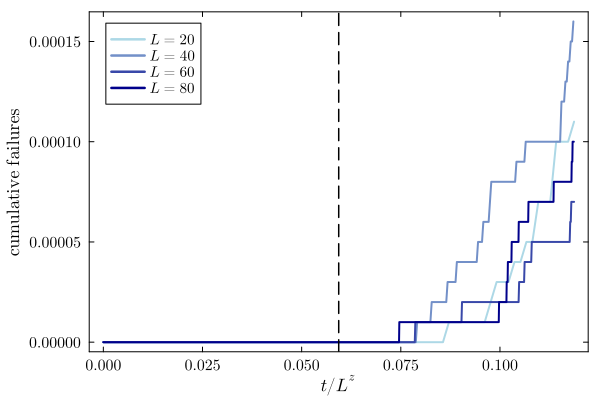

In [191]:
default(fontfamily = "Computer Modern")

# ── Parameters ────────────────────────────────────────────────
algo      = "MV"   # or whatever algo string you use
Ls        = 20:20:80
p         = 0.02
c         = NaN
qs        = 0.0:0.05:0.5
q_ts      = :critical   # or a specific Float64, e.g. 0.265
qc        = 0.22
ν         = 1.2
γ_ν       = 0.0         # γ/ν exponent
z         = 2.17
t_frac    = 0.5
T_factor  = 2           # only used when algo == "IsingML"
# ──────────────────────────────────────────────────────────────

key(L, q_) = algo == "IsingML" ? (algo, L, T_factor*L, p, q_, c) : (algo, L, 1600, p, q_, NaN)
has(L, q_) = haskey(all_results, key(L, q_))
dat(L, q_, sym) = all_results[key(L, q_)][sym]
nsteps(L, q_, sym) = length(dat(L, q_, sym)) - 1

q_ts_val = if q_ts === :critical
    qs_all = filter(q_ -> all(L -> has(L, q_), Ls), qs)
    isempty(qs_all) && error("No q in qs has data for all L")
    qs_all[argmin(abs.(qs_all .- qc))]
else
    q_ts
end

t_star = minimum(
    nsteps(L, first(filter(q_ -> has(L, q_), qs)), :cumulative_failures) / L^z
    for L in Ls if any(q_ -> has(L, q_), qs)
)
t_snap = t_frac * t_star

t_max = minimum(
    nsteps(L, q_ts_val, :M1s) / L^z
    for L in Ls if has(L, q_ts_val)
)

plt_cf_t = plot()

for (i, L) in enumerate(Ls)
    has(L, q_ts_val) || continue

    N    = nsteps(L, q_ts_val, :M1s)
    ts   = (0:N) ./ L^z
    mask = ts .<= t_max
    cf_t = dat(L, q_ts_val, :cumulative_failures)

    color = palette(:blues, length(Ls))[i]

    plot!(plt_cf_t, ts[mask], cf_t[mask],
        seriestype     = :line,
        # m              = 5,
        linewidth      = 2,
        label          = L"L = %$(L)",
        color          = color,
        framestyle     = :box,
        grid           = false,
        xlabel         = L"t / L^z",
        ylabel         = L"\mathrm{cumulative\ failures}",
        xtickfontsize  = 10, ytickfontsize  = 10,
        xguidefontsize = 12, yguidefontsize = 12,
        legendfontsize = 10, titlefontsize  = 16)
end

vline!(plt_cf_t, [t_snap],
    color = :black,
    lw    = 1.5,
    ls    = :dash,
    label = "")

plt_cf_t

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


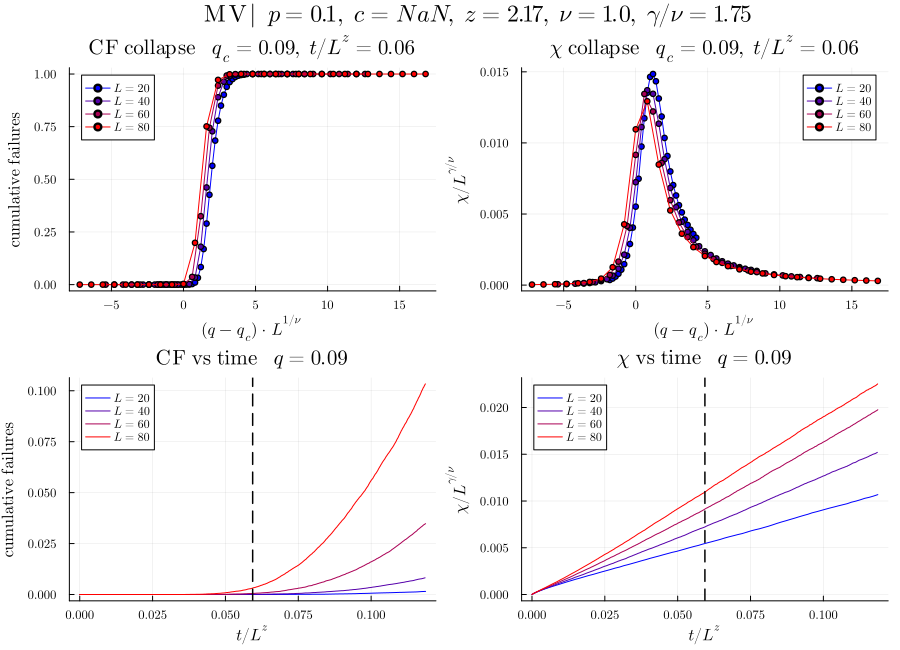

In [145]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "MV"
Ls       = 20:20:80
p        = 0.1
c        = NaN
qs       = 0.0:0.01:0.3
qc       = 0.09
q_ts     = :critical
ν        = 1.0
γ_ν      = 7/4
z        = 2.17
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.094, 0.096, 0.098, 0.1, 0.102, 0.104, 0.106, 0.11, 0.12, 0.13, 0.14, 0.15]


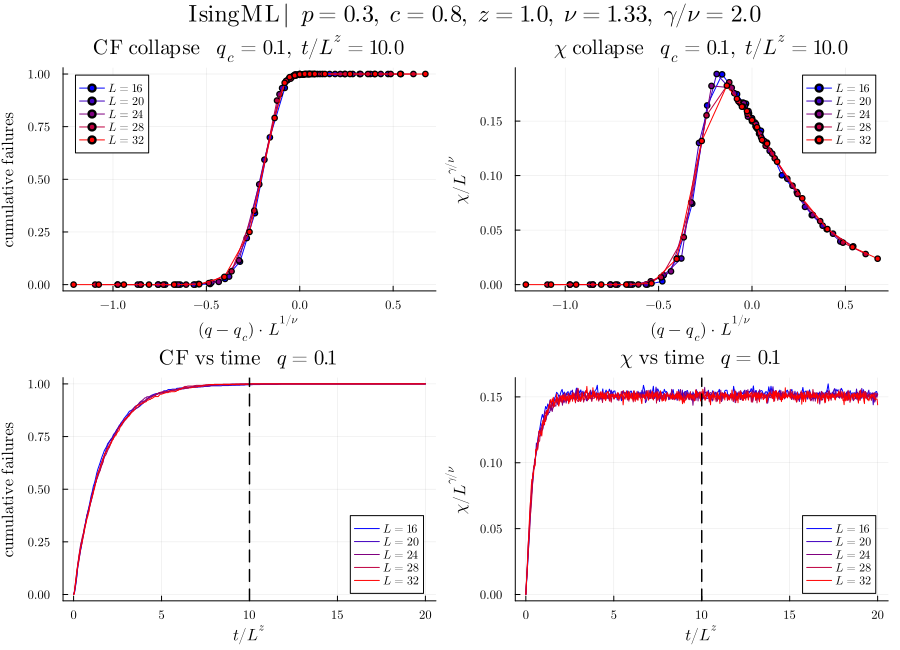

In [5]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.3
c        = 0.8
qs       = 0.01:0.002:0.15
qc       = 0.1
q_ts     = :critical
ν        = 4/3
γ_ν      = 2.0
z        = 1.0
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

In [6]:
all_results[("IsingML", 32, 20*32, 0.05, 0.15, 0.05)][:total_samples]

700

[0.15, 0.16, 0.17, 0.18, 0.186, 0.188, 0.19, 0.192, 0.194, 0.196, 0.198, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


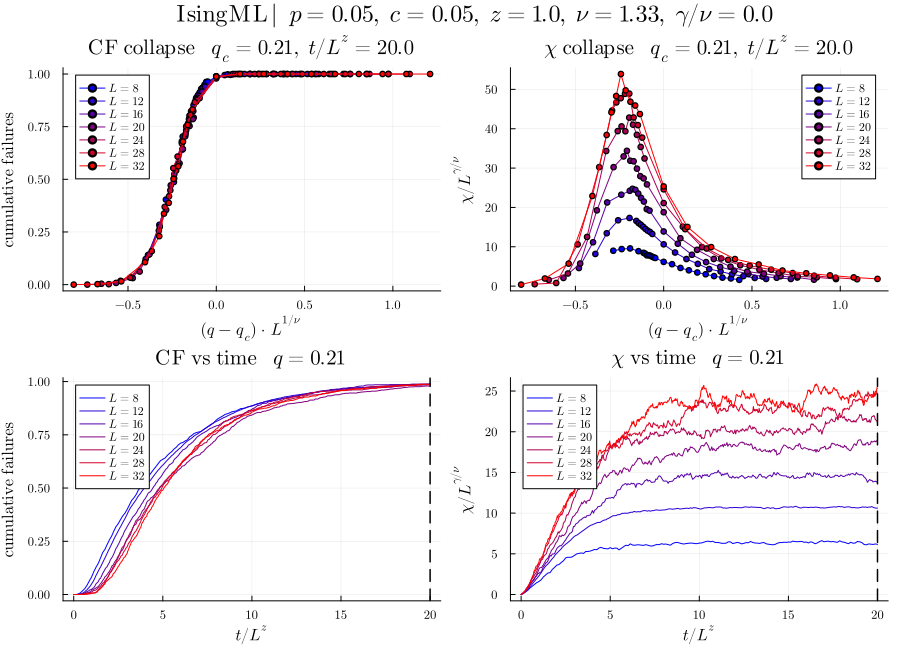

In [7]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 8:4:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.002:0.3
qc       = 0.21
q_ts     = :critical
ν        = 4/3
γ_ν      = 0.0
z        = 1.0
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

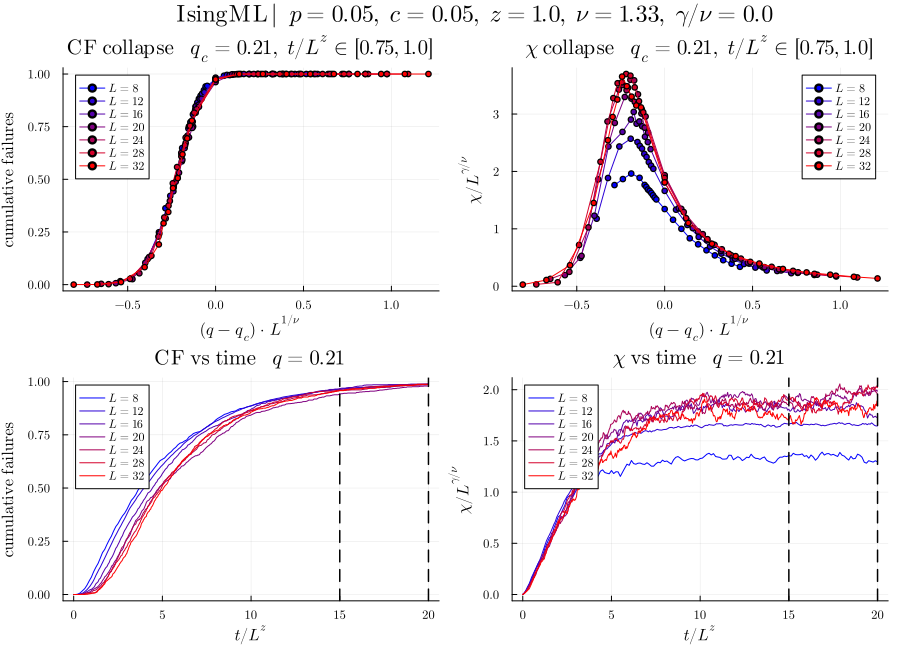

In [8]:
default(fontfamily = "Computer Modern")

# ── parameters ─────────────────────────────────────────────────────────────────
Ls        = 8:4:32
p, c      = 0.05, 0.05
qs        = 0.15:0.002:0.3
qc        = 0.21
ν, γ_ν, z = 4/3, 3/4, 1.0
T_factor  = 20
t_avg_lo  = 0.75   # averaging window: t/L^z in [t_avg_lo, t_avg_hi]
t_avg_hi  = 1.0

# ── helpers ─────────────────────────────────────────────────────────────────────
colors     = cgrad([:blue, :red], length(Ls), categorical=true)
key(L, q_) = ("IsingML", L, T_factor*L, p, q_, c)
has(L, q_) = haskey(all_results, key(L, q_))
dat(L, q_, sym) = all_results[key(L, q_)][sym]
nsteps(L, q_, sym) = length(dat(L, q_, sym)) - 1

# ── resolve q_ts ────────────────────────────────────────────────────────────────
qs_all   = filter(q_ -> all(L -> has(L, q_), Ls), qs)
isempty(qs_all) && error("No q in qs has data for all L")
q_ts_val = qs_all[argmin(abs.(qs_all .- qc))]

# ── shared time bounds ──────────────────────────────────────────────────────────
t_star = minimum(
    nsteps(L, first(filter(q_ -> has(L, q_), qs)), :cumulative_failures) / L^z
    for L in Ls if any(q_ -> has(L, q_), qs))

t_max = minimum(
    nsteps(L, q_ts_val, :M1s) / L^z
    for L in Ls if has(L, q_ts_val))

# ── build plots ─────────────────────────────────────────────────────────────────
plt_cf_fss = plot()
plt_χ_fss  = plot()
plt_cf_t   = plot()
plt_χ_t    = plot()

for (i, L) in enumerate(Ls)
    col      = colors[i]
    valid_qs = filter(q_ -> has(L, q_), qs)

    # FSS collapse: average χ and CF over [t_avg_lo, t_avg_hi] × L^z
    if !isempty(valid_qs)
        idx_lo = round(Int, t_avg_lo * t_star * L^z) + 1
        idx_hi = round(Int, t_avg_hi * t_star * L^z) + 1

        x   = (valid_qs .- qc) .* L^(1/ν)
        cf  = [mean(dat(L, q_, :cumulative_failures)[idx_lo:idx_hi]) for q_ in valid_qs]
        χv  = [L^2 * mean(dat(L, q_, :M2s)[idx_lo:idx_hi] .-
                           dat(L, q_, :M1s)[idx_lo:idx_hi].^2)       for q_ in valid_qs]

        plot!(plt_cf_fss, x, cf,           m=3, label=L"L = %$(L)", color=col)
        plot!(plt_χ_fss,  x, χv ./ L^γ_ν, m=3, label=L"L = %$(L)", color=col)
    end

    # time-series plots: single trajectory at q_ts_val
    has(L, q_ts_val) || continue
    N    = nsteps(L, q_ts_val, :M1s)
    ts   = (0:N) ./ L^z
    mask = ts .<= t_max
    M1s  = dat(L, q_ts_val, :M1s)
    M2s  = dat(L, q_ts_val, :M2s)

    plot!(plt_cf_t, ts[mask], dat(L, q_ts_val, :cumulative_failures)[mask], label=L"L = %$(L)", color=col)
    plot!(plt_χ_t,  ts[mask], (L^2 .* (M2s .- M1s.^2) ./ L^γ_ν)[mask],    label=L"L = %$(L)", color=col)
end

# dashed verticals showing the averaging window on the time-series plots
vline!(plt_cf_t, [t_avg_lo * t_star, t_avg_hi * t_star], color=:black, lw=1.5, ls=:dash, label="")
vline!(plt_χ_t,  [t_avg_lo * t_star, t_avg_hi * t_star], color=:black, lw=1.5, ls=:dash, label="")

# ── labels & titles ─────────────────────────────────────────────────────────────
plot!(plt_cf_fss, xlabel=L"(q-q_c)\cdot L^{1/\nu}", ylabel=L"\mathrm{cumulative\ failures}",
      title=latexstring("\\mathrm{CF\\ collapse}\\quad q_c=0.21,\\; t/L^z\\in[$(t_avg_lo),$(t_avg_hi)]"))
plot!(plt_χ_fss,  xlabel=L"(q-q_c)\cdot L^{1/\nu}", ylabel=L"\chi/L^{\gamma/\nu}",
      title=latexstring("\\chi\\;\\mathrm{collapse}\\quad q_c=0.21,\\; t/L^z\\in[$(t_avg_lo),$(t_avg_hi)]"))
plot!(plt_cf_t,   xlabel=L"t/L^z", ylabel=L"\mathrm{cumulative\ failures}",
      title=latexstring("\\mathrm{CF\\ vs\\ time}\\quad q=$(round(q_ts_val, digits=3))"))
plot!(plt_χ_t,    xlabel=L"t/L^z", ylabel=L"\chi/L^{\gamma/\nu}",
      title=latexstring("\\chi\\;\\mathrm{vs\\ time}\\quad q=$(round(q_ts_val, digits=3))"))

plot(plt_cf_fss, plt_χ_fss, plt_cf_t, plt_χ_t,
     layout=@layout([a b; c d]), size=(900, 650),
     plot_title=L"\mathrm{IsingML}\;|\;p=0.05,\;c=0.05,\;z=1.0,\;\nu=1.33,\;\gamma/\nu=0.0")

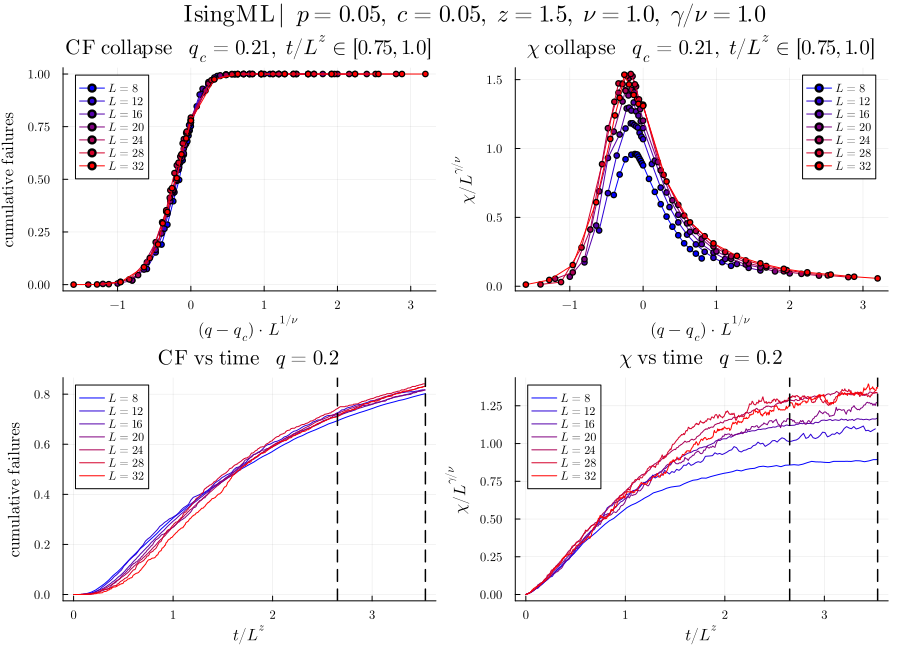

In [9]:
default(fontfamily = "Computer Modern")

# ── parameters ─────────────────────────────────────────────────────────────────
Ls        = 8:4:32
p, c      = 0.05, 0.05
qs        = 0.15:0.002:0.3
qc        = 0.2
ν, γ_ν, z = 1.0, 1.0, 1.5
T_factor  = 20
t_avg_lo  = 0.75   # averaging window: t/L^z in [t_avg_lo, t_avg_hi]
t_avg_hi  = 1.0

# ── helpers ─────────────────────────────────────────────────────────────────────
colors     = cgrad([:blue, :red], length(Ls), categorical=true)
key(L, q_) = ("IsingML", L, T_factor*L, p, q_, c)
has(L, q_) = haskey(all_results, key(L, q_))
dat(L, q_, sym) = all_results[key(L, q_)][sym]
nsteps(L, q_, sym) = length(dat(L, q_, sym)) - 1

# ── resolve q_ts ────────────────────────────────────────────────────────────────
qs_all   = filter(q_ -> all(L -> has(L, q_), Ls), qs)
isempty(qs_all) && error("No q in qs has data for all L")
q_ts_val = qs_all[argmin(abs.(qs_all .- qc))]

# ── shared time bounds ──────────────────────────────────────────────────────────
t_star = minimum(
    nsteps(L, first(filter(q_ -> has(L, q_), qs)), :cumulative_failures) / L^z
    for L in Ls if any(q_ -> has(L, q_), qs))

t_max = minimum(
    nsteps(L, q_ts_val, :M1s) / L^z
    for L in Ls if has(L, q_ts_val))

# ── build plots ─────────────────────────────────────────────────────────────────
plt_cf_fss = plot()
plt_χ_fss  = plot()
plt_cf_t   = plot()
plt_χ_t    = plot()

for (i, L) in enumerate(Ls)
    col      = colors[i]
    valid_qs = filter(q_ -> has(L, q_), qs)

    # FSS collapse: average χ and CF over [t_avg_lo, t_avg_hi] × L^z
    if !isempty(valid_qs)
        idx_lo = round(Int, t_avg_lo * t_star * L^z) + 1
        idx_hi = round(Int, t_avg_hi * t_star * L^z) + 1

        x   = (valid_qs .- qc) .* L^(1/ν)
        cf  = [mean(dat(L, q_, :cumulative_failures)[idx_lo:idx_hi]) for q_ in valid_qs]
        χv  = [L^2 * mean(dat(L, q_, :M2s)[idx_lo:idx_hi] .-
                           dat(L, q_, :M1s)[idx_lo:idx_hi].^2)       for q_ in valid_qs]

        plot!(plt_cf_fss, x, cf,           m=3, label=L"L = %$(L)", color=col)
        plot!(plt_χ_fss,  x, χv ./ L^γ_ν, m=3, label=L"L = %$(L)", color=col)
    end

    # time-series plots: single trajectory at q_ts_val
    has(L, q_ts_val) || continue
    N    = nsteps(L, q_ts_val, :M1s)
    ts   = (0:N) ./ L^z
    mask = ts .<= t_max
    M1s  = dat(L, q_ts_val, :M1s)
    M2s  = dat(L, q_ts_val, :M2s)

    plot!(plt_cf_t, ts[mask], dat(L, q_ts_val, :cumulative_failures)[mask], label=L"L = %$(L)", color=col)
    plot!(plt_χ_t,  ts[mask], (L^2 .* (M2s .- M1s.^2) ./ L^γ_ν)[mask],    label=L"L = %$(L)", color=col)
end

# dashed verticals showing the averaging window on the time-series plots
vline!(plt_cf_t, [t_avg_lo * t_star, t_avg_hi * t_star], color=:black, lw=1.5, ls=:dash, label="")
vline!(plt_χ_t,  [t_avg_lo * t_star, t_avg_hi * t_star], color=:black, lw=1.5, ls=:dash, label="")

# ── labels & titles ─────────────────────────────────────────────────────────────
plot!(plt_cf_fss, xlabel=L"(q-q_c)\cdot L^{1/\nu}", ylabel=L"\mathrm{cumulative\ failures}",
      title=latexstring("\\mathrm{CF\\ collapse}\\quad q_c=0.21,\\; t/L^z\\in[$(t_avg_lo),$(t_avg_hi)]"))
plot!(plt_χ_fss,  xlabel=L"(q-q_c)\cdot L^{1/\nu}", ylabel=L"\chi/L^{\gamma/\nu}",
      title=latexstring("\\chi\\;\\mathrm{collapse}\\quad q_c=0.21,\\; t/L^z\\in[$(t_avg_lo),$(t_avg_hi)]"))
plot!(plt_cf_t,   xlabel=L"t/L^z", ylabel=L"\mathrm{cumulative\ failures}",
      title=latexstring("\\mathrm{CF\\ vs\\ time}\\quad q=$(round(q_ts_val, digits=3))"))
plot!(plt_χ_t,    xlabel=L"t/L^z", ylabel=L"\chi/L^{\gamma/\nu}",
      title=latexstring("\\chi\\;\\mathrm{vs\\ time}\\quad q=$(round(q_ts_val, digits=3))"))

plot(plt_cf_fss, plt_χ_fss, plt_cf_t, plt_χ_t,
     layout=@layout([a b; c d]), size=(900, 650),
     plot_title=L"\mathrm{IsingML}\;|\;p=%$p,\;c=%$c,\;z=%$z,\;\nu=%$ν,\;\gamma/\nu=%$(γ_ν)")

    

[0.15, 0.16, 0.17, 0.18, 0.186, 0.188, 0.19, 0.192, 0.194, 0.196, 0.198, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


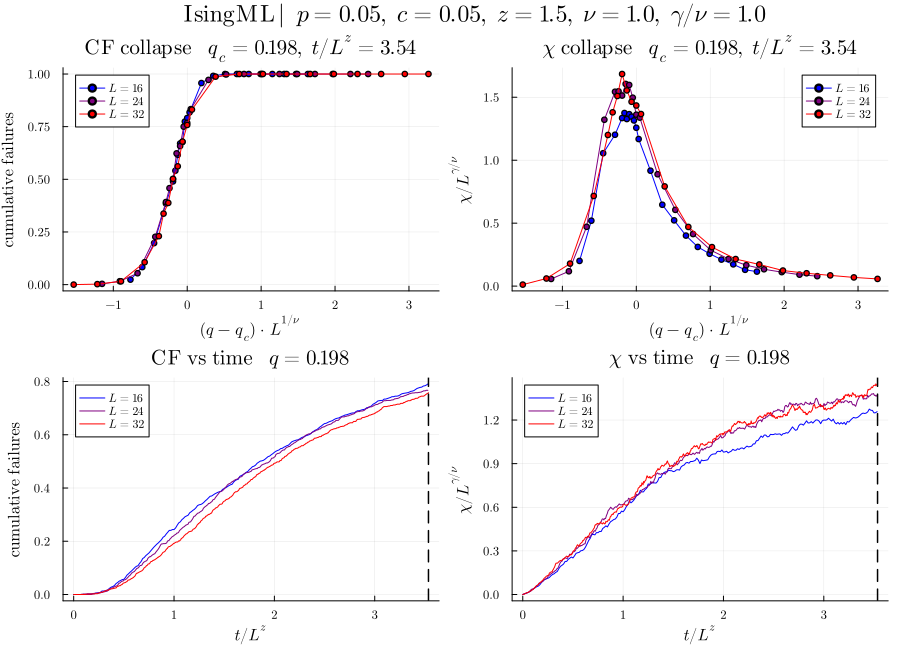

In [13]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:8:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.002:0.3
qc       = 0.198
q_ts     = :critical
ν        = 1.0
γ_ν      = 1.0
z        = 1.5
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.186, 0.188, 0.19, 0.192, 0.194, 0.196, 0.198, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


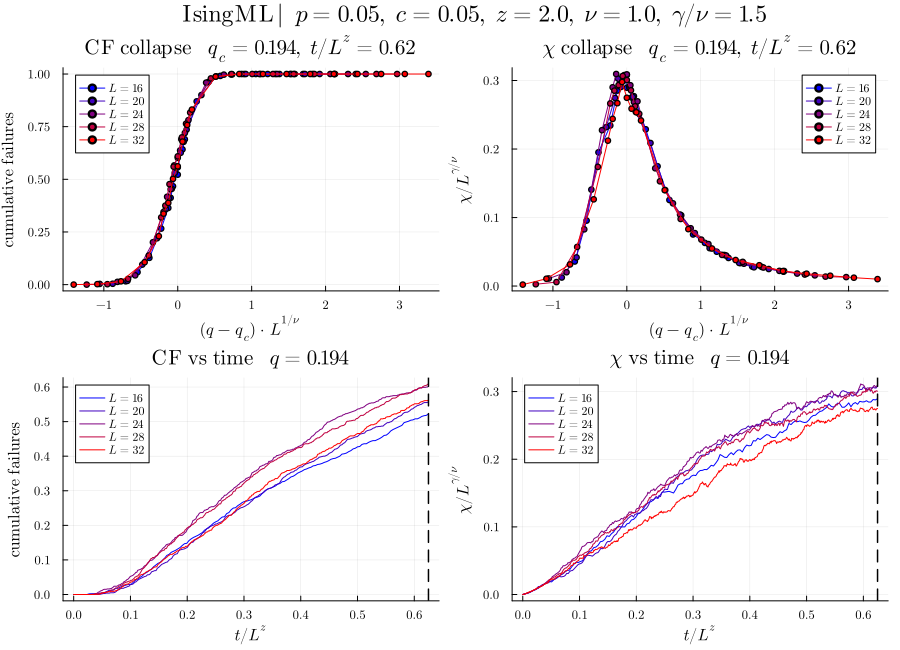

In [14]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.002:0.3
qc       = 0.194
q_ts     = :critical
ν        = 1.0
γ_ν      = 1.5
z        = 2.0
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.186, 0.188, 0.19, 0.192, 0.194, 0.196, 0.198, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


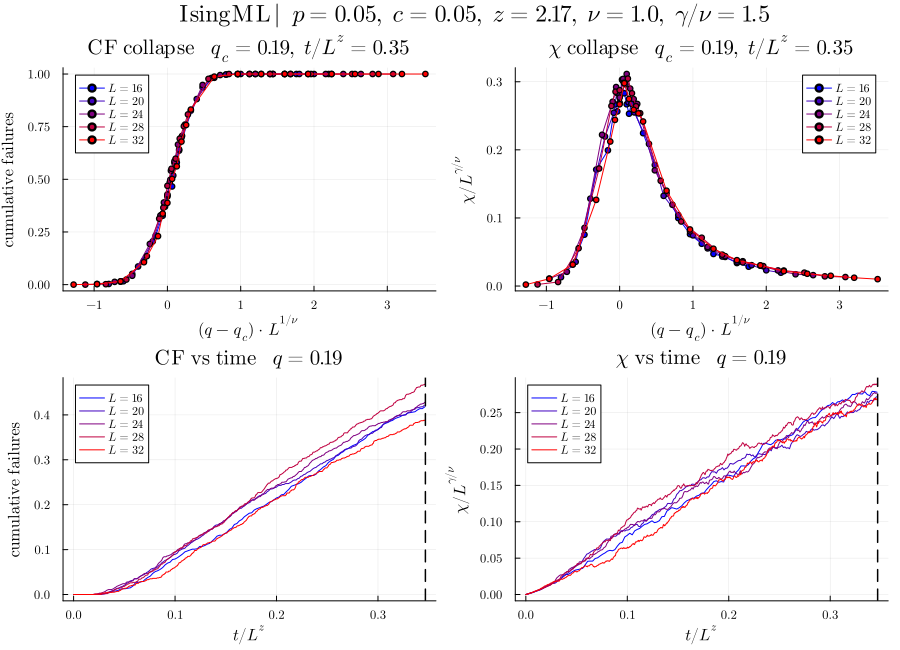

In [15]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.002:0.3
qc       = 0.19
q_ts     = :critical
ν        = 1.0
γ_ν      = 1.5
z        = 2.17
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25]


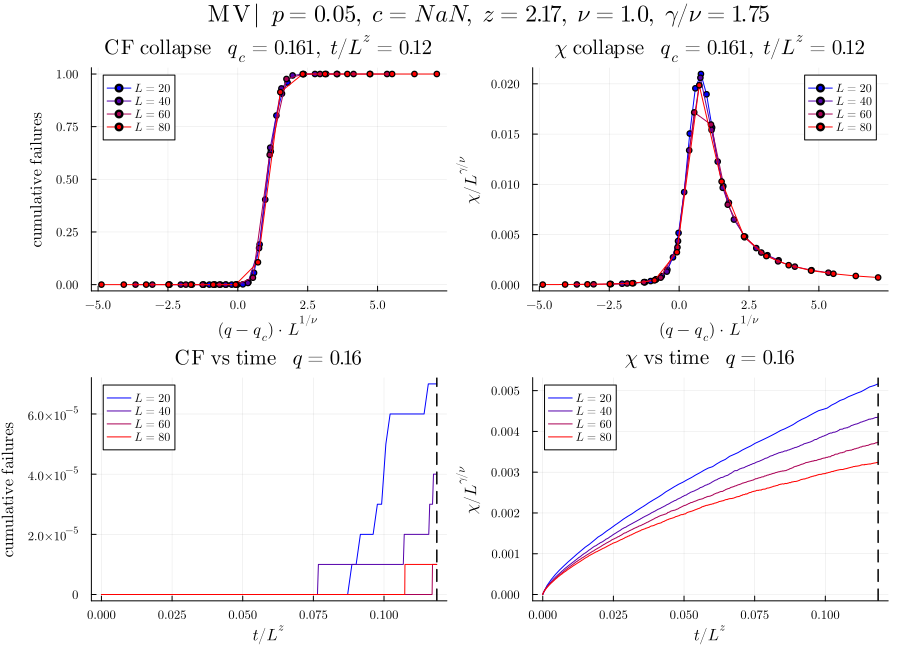

In [17]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "MV"
Ls       = 20:20:80
p        = 0.05
c        = NaN
qs       = 0.1:0.01:0.25
qc       = 0.161
q_ts     = :critical
ν        = 1.0
γ_ν      = 7/4
z        = 2.17
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 1600

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.094, 0.096, 0.098, 0.1, 0.102, 0.104, 0.106, 0.11, 0.12, 0.13, 0.14, 0.15]


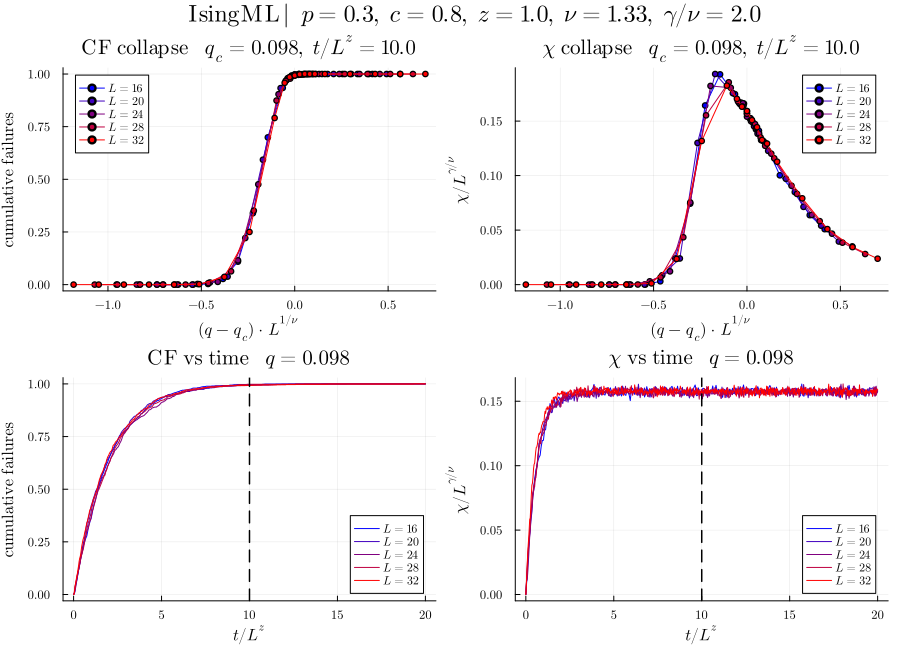

In [18]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.3
c        = 0.8
qs       = 0.01:0.002:0.15
qc       = 0.098
q_ts     = :critical
ν        = 4/3
γ_ν      = 2.0
z        = 1.0
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15]


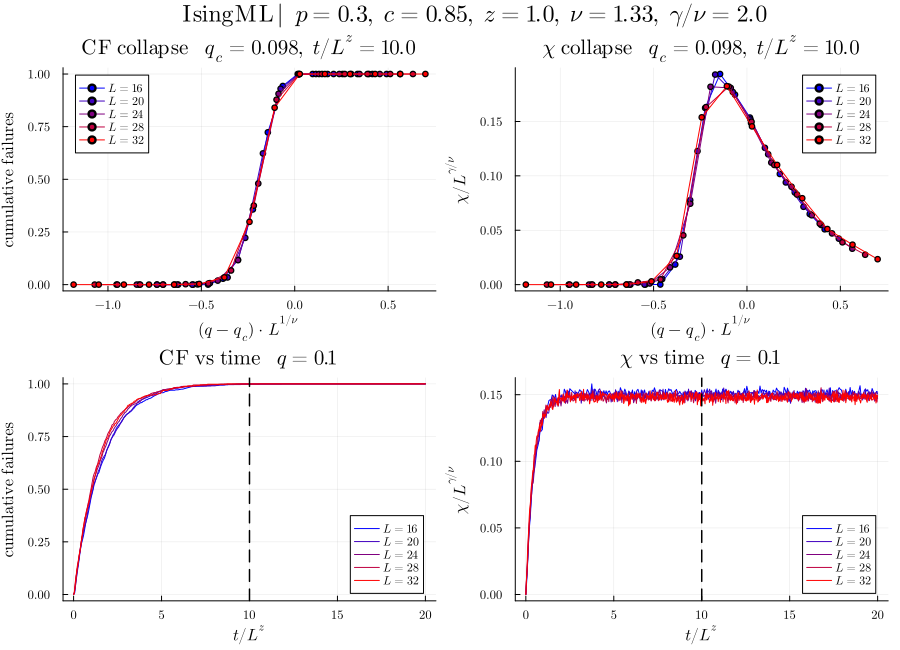

In [19]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.3
c        = 0.85
qs       = 0.01:0.002:0.15
qc       = 0.098
q_ts     = :critical
ν        = 4/3
γ_ν      = 2.0
z        = 1.0
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.186, 0.188, 0.19, 0.192, 0.194, 0.196, 0.198, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


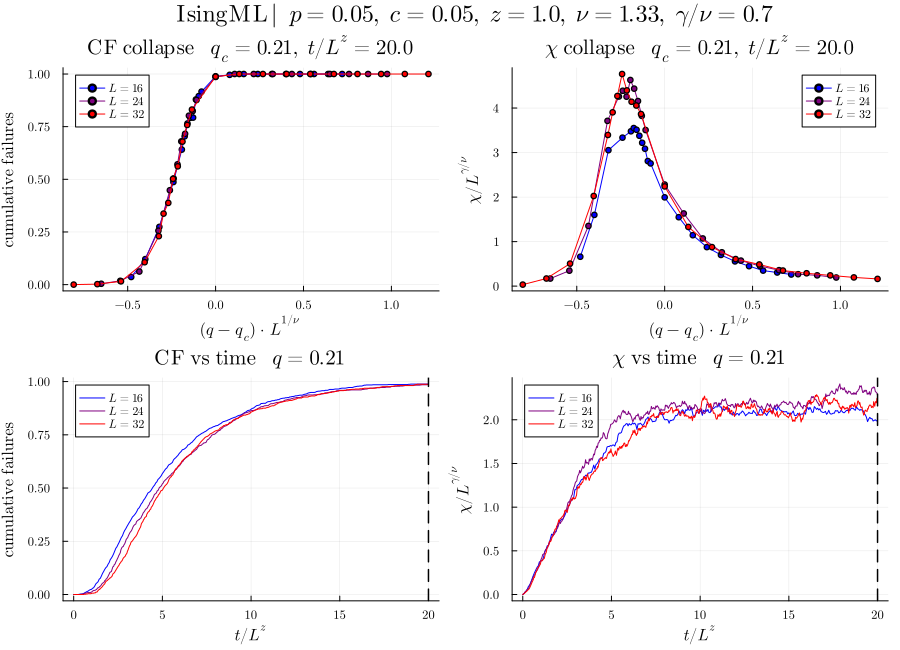

In [20]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:8:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.002:0.3
qc       = 0.21
q_ts     = :critical
ν        = 4/3
γ_ν      = 0.7
z        = 1.0
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


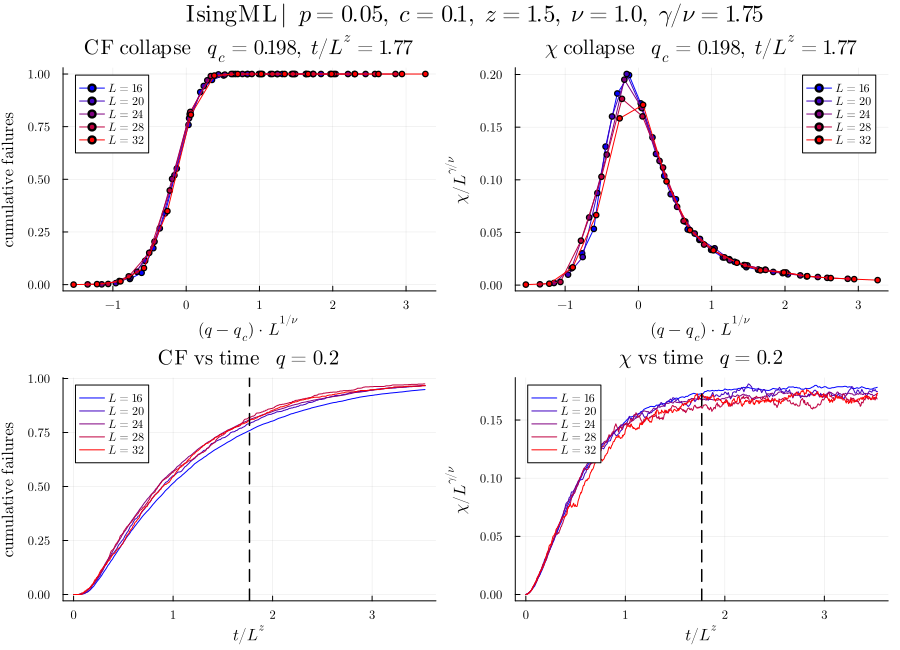

In [21]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.05
c        = 0.1
qs       = 0.15:0.002:0.3
qc       = 0.198
q_ts     = :critical
ν        = 1.0
γ_ν      = 7/4
z        = 1.5
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


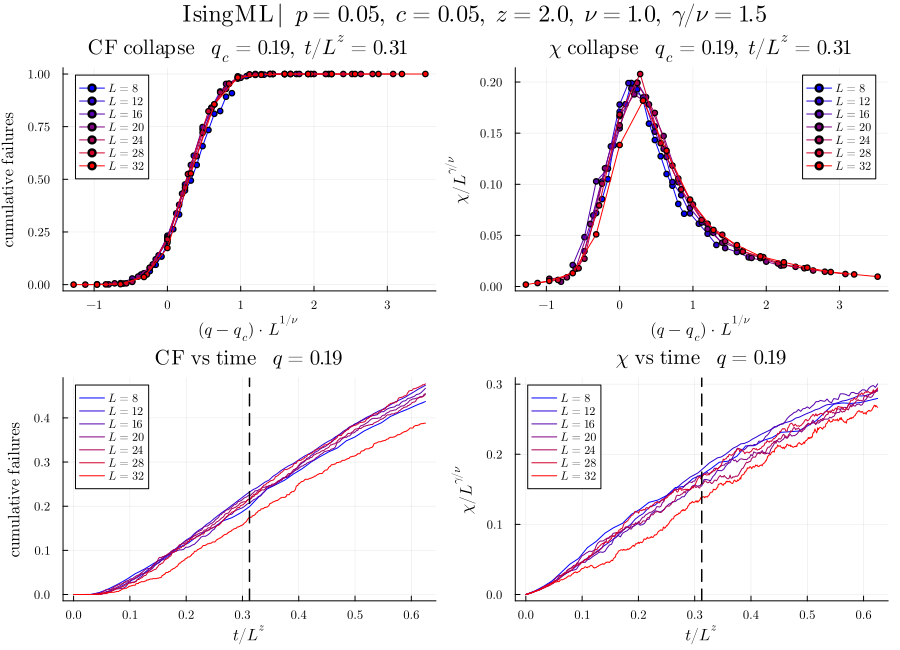

In [22]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 8:4:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.01:0.3
qc       = 0.19
q_ts     = :critical
ν        = 1.0
γ_ν      = 1.5
z        = 2.0
t_frac   = 0.5     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)

[0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3]


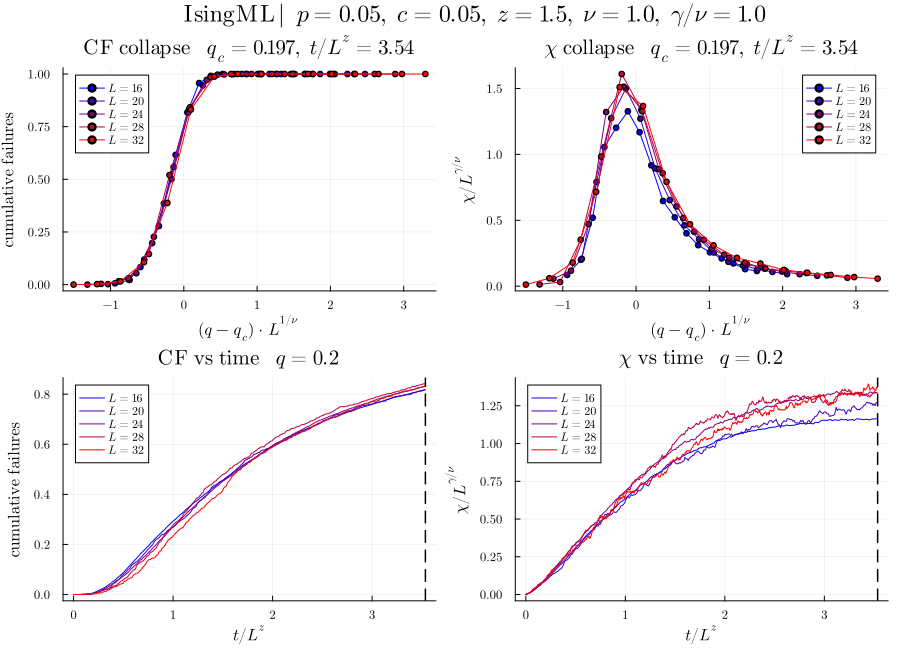

In [77]:
# ── parameters ────────────────────────────────────────────────────────────────
algo     = "IsingML"
Ls       = 16:4:32
p        = 0.05
c        = 0.05
qs       = 0.15:0.01:0.3
qc       = 0.197
q_ts     = :critical
ν        = 1.0
γ_ν      = 1.0
z        = 1.5
t_frac   = 1.0     # 0 = start, 1 = latest time common to all L
T_factor = 20

fss_explore(all_results; algo, Ls, p, c, qs, q_ts, qc, ν, γ_ν, z, t_frac, T_factor)